<a href="https://colab.research.google.com/github/emanueledalsasso/InGARSS2021/blob/main/InGARSS_time_series_PW.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PRACTICAL SESSION
## Tutorial HD-1: Multitemporal Remote Sensing Data Analysis
### Francesca Bovolo, Florence Tupin, Emanuele Dalsasso

In this practical work you will be guided through a series of tools aiming at extracting information from optical and SAR time series, namely for change detection purposes.

## 0. Download data and install needed libraries

In [ ]:
!wget -O optical_data.zip https://osf.io/zx7fj/download
!unzip optical_data.zip
!wget -O dcvaPython.zip https://osf.io/zv6nt/download
!unzip dcvaPython.zip
!wget -O tools_ED.py https://osf.io/ukvr2/download
!wget https://perso.telecom-paristech.fr/dalsasso/TPSAR/mvalab.py


--2021-12-04 10:16:24--  https://osf.io/zx7fj/download
Resolving osf.io (osf.io)... 35.190.84.173
Connecting to osf.io (osf.io)|35.190.84.173|:443... connected.
HTTP request sent, awaiting response... 302 FOUND
Location: https://files.de-1.osf.io/v1/resources/n2aym/providers/osfstorage/61a9e79a4d4ce504c876ea6e?action=download&direct&version=1 [following]
--2021-12-04 10:16:24--  https://files.de-1.osf.io/v1/resources/n2aym/providers/osfstorage/61a9e79a4d4ce504c876ea6e?action=download&direct&version=1
Resolving files.de-1.osf.io (files.de-1.osf.io)... 35.186.249.111
Connecting to files.de-1.osf.io (files.de-1.osf.io)|35.186.249.111|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 189635909 (181M) [application/octet-stream]
Saving to: ‘optical_data.zip’

optical_data.zip    100%[===================>] 180.85M  34.1MB/s    in 6.0s    

2021-12-04 10:16:31 (30.2 MB/s) - ‘optical_data.zip’ saved [189635909/189635909]

Archive:  optical_data.zip
   creating: optical_d

In [ ]:
!pip install kmodes

In [ ]:
from tools_ED import *
import scipy.io as sio
import mvalab
import math
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from google_drive_downloader import GoogleDriveDownloader as gdd
import cmath

plt.rcParams['figure.figsize'] = [8, 8]

## 1. OPTICAL DATA: Visualize changes between two images

### 1.1 Optical images for deforestation monitoring
In this part, you will be looking at two Sentinel-2 optical images downloaded from the Sentinel Hub API. The two images have been acquired on 2018-12-08 and on 2019-02-06 on the Amazzonian forest in Brazil. 

To monitor the evolution of the vegetation, a useful indicator is the Normalized Difference Vegetation Index (NDVI) defined as follows:
$$
NDVI = \frac{NIR-R}{NIR+R}
$$
where NIR is the Near InfraRed band and R is the Red band

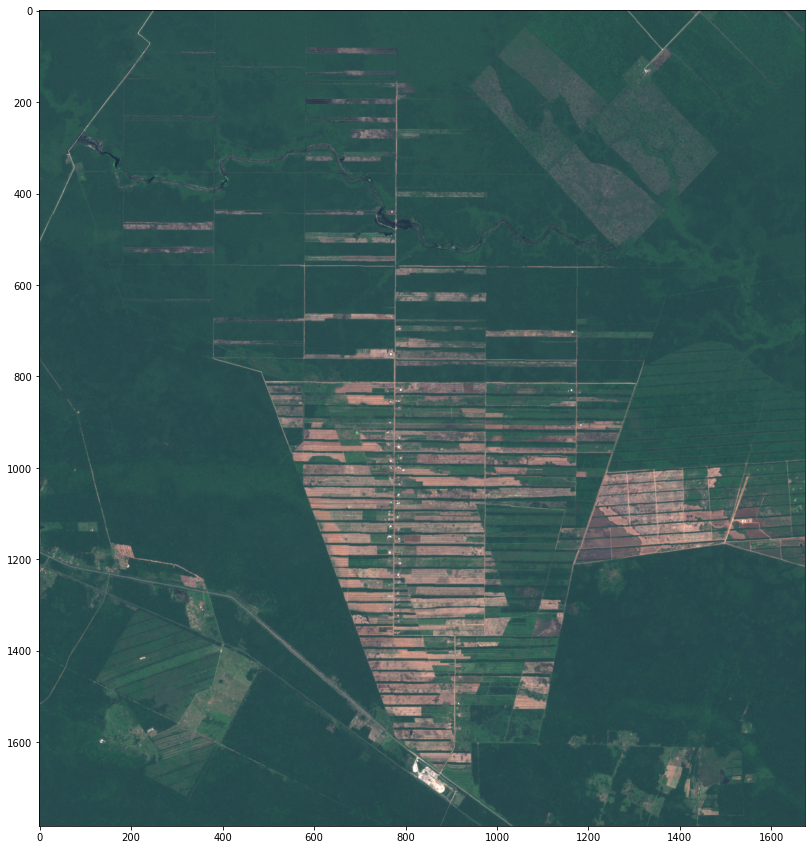

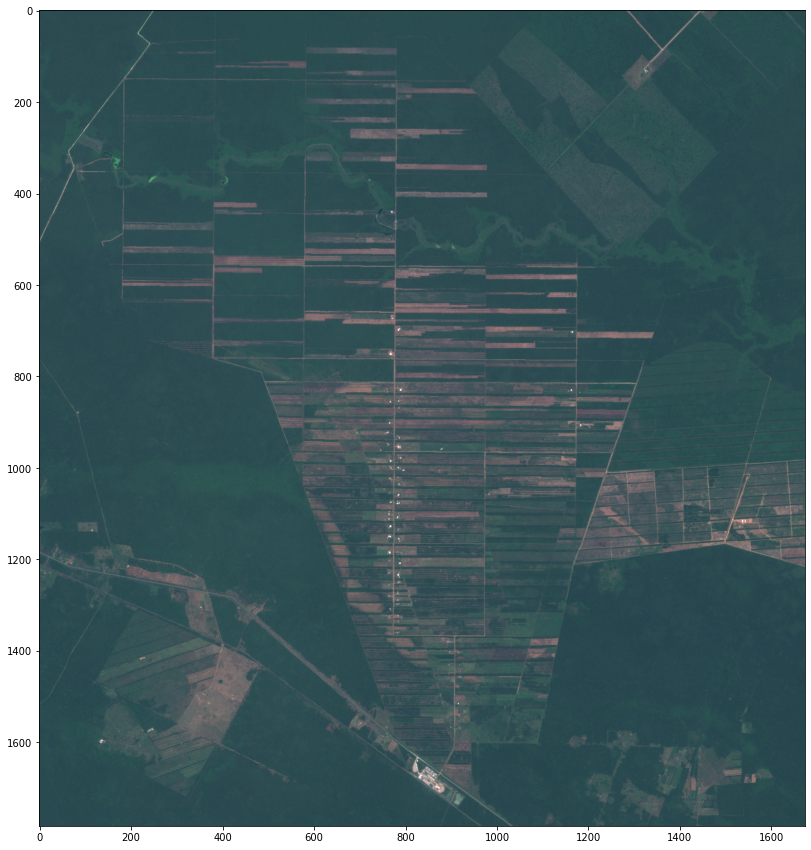

In [ ]:
forest_preChange = np.load('/content/optical_data/brazil_2018-12-08_RGB.npy')
forest_postChange = np.load('/content/optical_data/brazil_2019-02-06_RGB.npy')
plot_image_rgb(forest_preChange)
plot_image_rgb(forest_postChange)

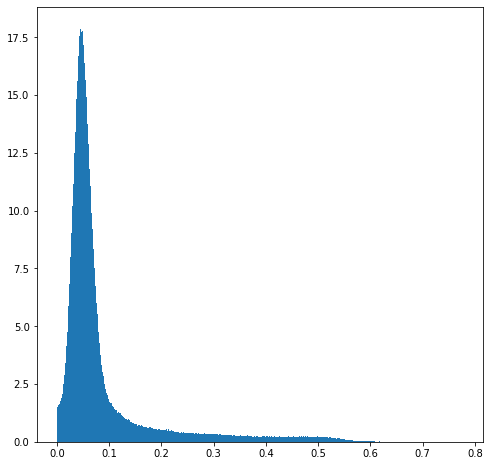

In [ ]:
preNDVI = fndvi(np.load('/content/optical_data/brazil_2018-12-08_bands.npy'))
postNDVI = fndvi(np.load('/content/optical_data/brazil_2019-02-06_data.npy'))
change_map = np.abs(preNDVI-postNDVI)
plot_histogram(change_map)


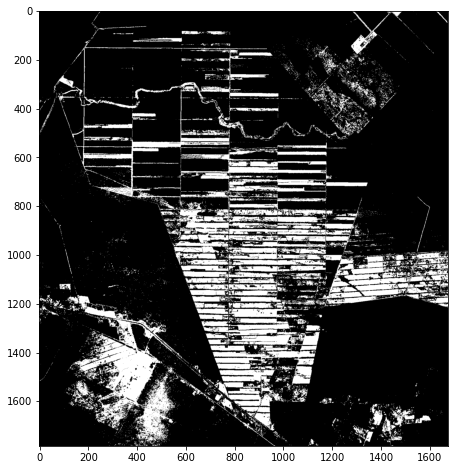

In [ ]:
apply_thesholding(change_map,0.1)

### 1.2 Change detection between two optical images: Change Vector Analysis (CVA)
In this part, you will be looking at two Pleiades optical images of the city of Trento, Italy. These images have four bands: R,G,B and NIR.

A strategy that can be employed to detect temporal changes is through Change Vector Analysis (CVA).
In this first part, each image is treated as a vector and the euclidean distance between the two vector images is computed.
We will have a look at its histogram and then apply the proper threshold to discrimate changed areas and non-changed areas.

*Please note that in this notebook we will choose the threshold manually.* However, this step can be automated by using threhsolding techniques such as OTSU. Moreover, the change map can be refined using morphological filters.

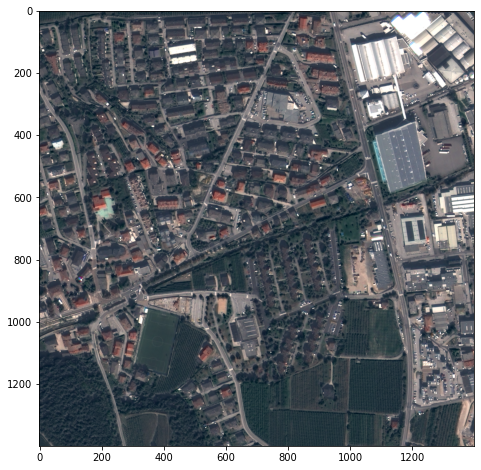

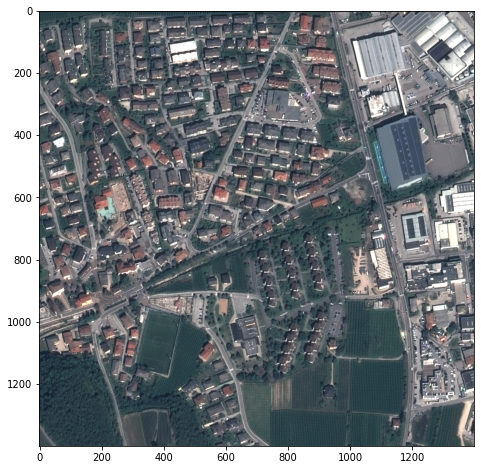

In [ ]:
data = sio.loadmat('/content/dcvaPython/data/pleiadesTrentoDatasetDCVAGithubCompliant.mat')
preChangeImage=data['preChangeImage']
postChangeImage=data['postChangeImage']
plot_optical_rgb(preChangeImage)
plot_optical_rgb(postChangeImage)

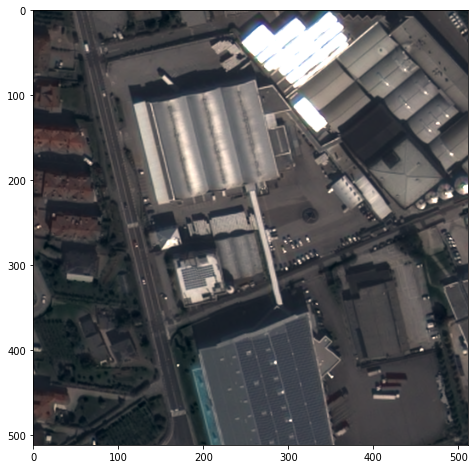

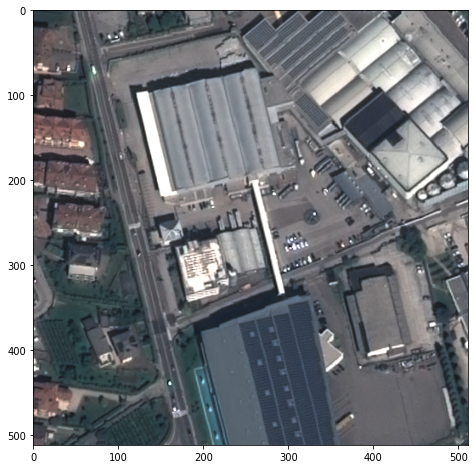

In [ ]:
cropData = data
cropData['preChangeImage'] = preChangeImage[:512,-512:,:]
cropData['postChangeImage'] = postChangeImage[:512,-512:,:]
sio.savemat('/content/dcvaPython/data/CropTrentoDataset.mat',cropData)

plot_optical_rgb(cropData['preChangeImage'])
plot_optical_rgb(cropData['postChangeImage'])

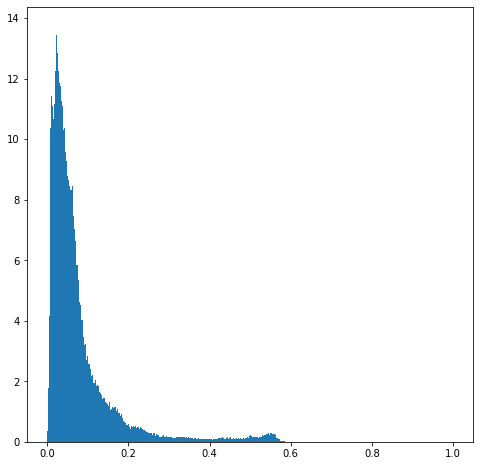

In [ ]:
# Normalize the features (separate for both images)
meanVectorsTime1Image=np.mean(cropData['preChangeImage'],axis=(0,1))      
stdVectorsTime1Image=np.std(cropData['preChangeImage'],axis=(0,1))
normalizedModifiedTimeVector1=(cropData['preChangeImage']-meanVectorsTime1Image)/stdVectorsTime1Image
    
meanVectorsTime2Image=np.mean(cropData['postChangeImage'],axis=(0,1))      
stdVectorsTime2Image=np.std(cropData['postChangeImage'],axis=(0,1))
normalizedModifiedTimeVector2=(cropData['postChangeImage']-meanVectorsTime2Image)/stdVectorsTime2Image

# Compute distance between the two normalized vectors
absoluteTimeVectorDifference=np.absolute(normalizedModifiedTimeVector1-normalizedModifiedTimeVector2)
detectedChangeMap=np.linalg.norm(absoluteTimeVectorDifference,axis=(2))
detectedChangeMapNormalized=(detectedChangeMap-np.amin(detectedChangeMap))/(np.amax(detectedChangeMap)-np.amin(detectedChangeMap))
plot_histogram(detectedChangeMapNormalized)

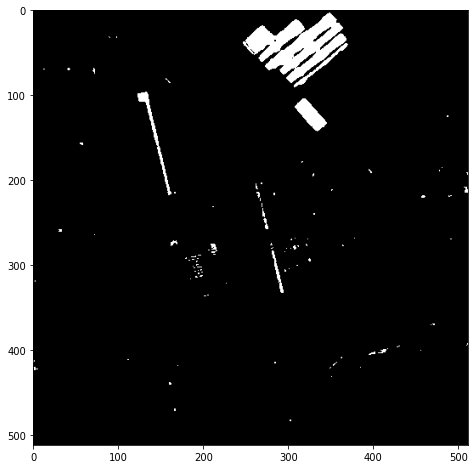

In [ ]:
apply_thesholding(detectedChangeMapNormalized,0.4)

### 1.3 Deep CVA
In this part, Change Vector Analysis is computed between features extracted by a Convolutional Neural Network as presented in:
```
S. Saha, F. Bovolo, L. Bruzzone, 
«Unsupervised Deep Change Vector Analysis for 
Multiple-Change Detection in VHR Images,»  
IEEE Transactions on Geoscience and Remote Sensing, Vol. 57, No. 6, pp. 3677-3693, 2019.

```


You can play with the number of layers as shown below to see the richness of information captured by deeper layers of the network. 

In [ ]:
!python /content/dcvaPython/dcvaUnequalRowColumn.py --dataPath /content/dcvaPython/data/CropTrentoDataset.mat --layersToProcess '5'

Processing layer number:5
0
0
(512, 512, 4)
(512, 512, 4)
(512, 512, 128)


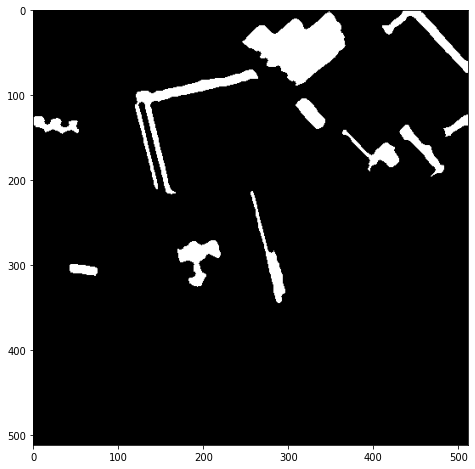

In [ ]:
plt.figure()
plt.imshow(plt.imread('/content/result/binaryCdResult.png'))
plt.show()

In [ ]:
!python /content/dcvaPython/dcvaUnequalRowColumn.py --dataPath /content/dcvaPython/data/CropTrentoDataset.mat --layersToProcess '5,8,10,11'

Processing layer number:5
0
0
(512, 512, 4)
(512, 512, 4)
(512, 512, 128)
Processing layer number:8
0
0
(512, 512, 4)
(512, 512, 4)
(512, 512, 256)
Processing layer number:10
0
0
(512, 512, 4)
(512, 512, 4)
(512, 512, 256)
Processing layer number:11
0
0
(512, 512, 4)
(512, 512, 4)
(512, 512, 256)


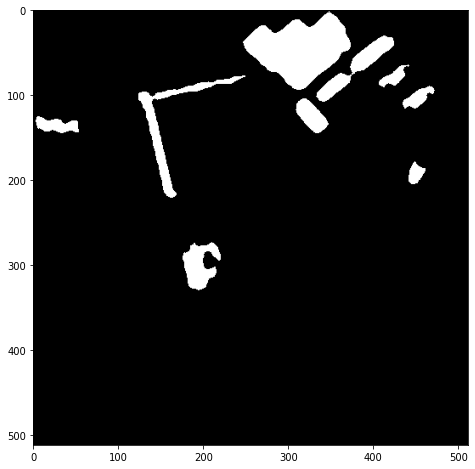

In [ ]:
plt.figure()
plt.imshow(plt.imread('/content/result/binaryCdResult.png'))
plt.show()

## 2. SAR DATA: Time-series analysis and visualization tools

In this part, we will work with a time series of 25 Sentinel-1 single-look-complex **co-registered** images acquired in the Netherlands between 2015-10-06 and 2016-11-05.

In [ ]:
webpage='https://perso.telecom-paristech.fr/dalsasso/TPSAR/pilelely/multitemp/'
image='lely_tuple_multitemp.IMA'
im_lely_multitemp = mvalab.imz2mat(webpage+image)
im_lely = im_lely_multitemp[0][:,:,0]

imz2mat : version janvier 2018.  Fichier à ouvrir : https://perso.telecom-paristech.fr/dalsasso/TPSAR/pilelely/multitemp/lely_tuple_multitemp.IMA
Nom compatible url
Nom compatible url
INFO - reading header/dim : https://perso.telecom-paristech.fr/dalsasso/TPSAR/pilelely/multitemp/lely_tuple_multitemp.dim
Multitemporal image 25 data
Fichiers PC
Image  complex float
lecture .dim OK -> largeur:512 hauteur:512 profondeur:25
Debug 2 4 512
4 512 <f


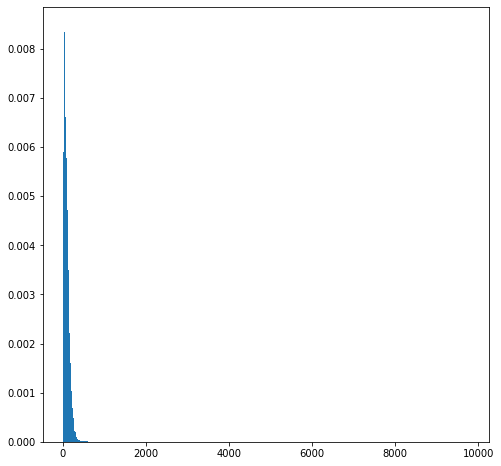

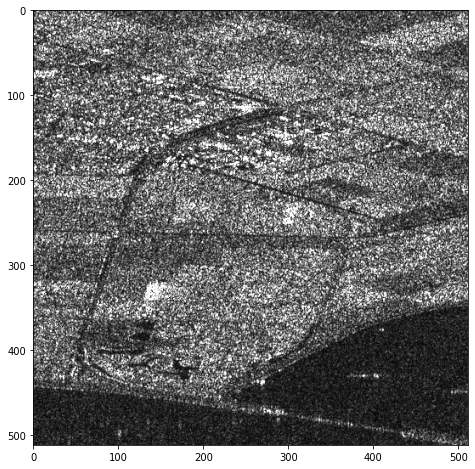

In [ ]:
plot_histogram(np.abs(im_lely))
plot_lely(np.abs(im_lely))

### 2.1 Change detection: visualize changes between two images
To display changes between two images of the same area acquired at different times we can compute $\varphi$ as follows:

$\varphi =  \max ${r, $\frac{1}{r}$ }$ $

with $ r =  \frac{I_2}{I_1}$

Then we can plot it by thresholding at a chosen value $th$: if $\varphi > th$ a change has occurred.  The threshold can be changed according to the false alarm rate.  
Here, we are going to analyse the impact of denoising on change detection.

<Figure size 576x576 with 0 Axes>

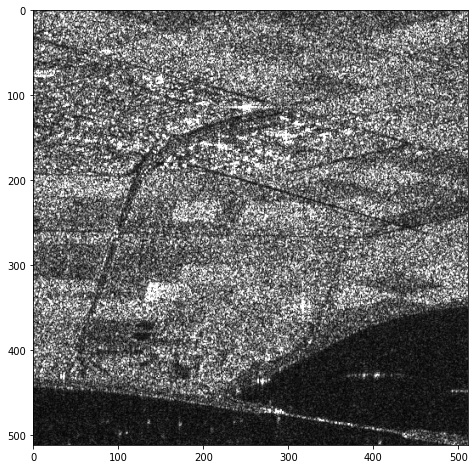

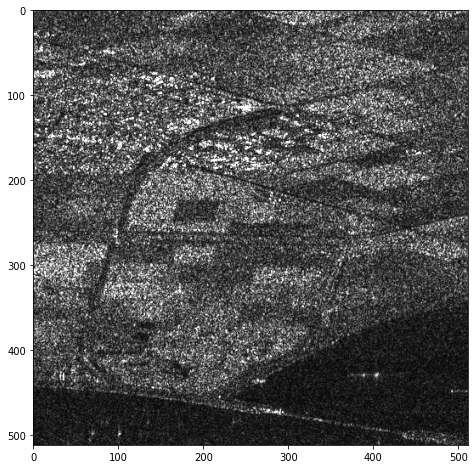

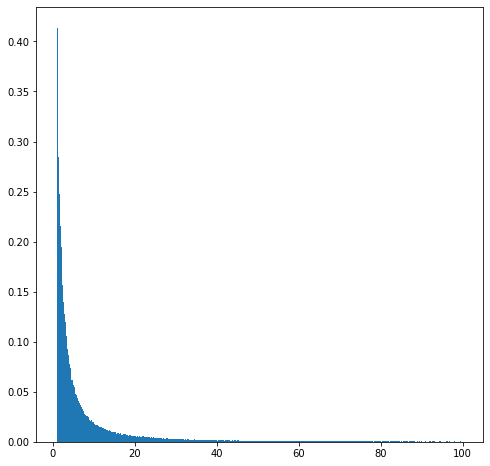

In [ ]:
idx1 = 1 
idx2 = 20
im1 = np.abs(im_lely_multitemp[0][:,:,idx1]) #amplitude
im2 = np.abs(im_lely_multitemp[0][:,:,idx2]) #amplitude
ratio_image = np.square(im1/(im2+0.001)) # ratio in intensity
phi = np.maximum(ratio_image, 1/ratio_image) # phi > 1, phi = 1 if there are no changes
plt.set_cmap('gray')
plot_lely(im1)
plot_lely(im2)

plot_histogram(phi,low=1.0,high=100.0) 

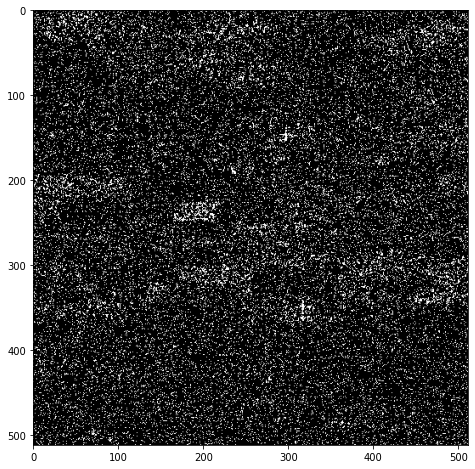

In [ ]:
threshold = 20.0
apply_thesholding(phi,threshold)  

The same technique is now applied on the same time-series, filtered using the deep-learning based despeckling algorithm SAR2SAR:
```
E. Dalsasso, L. Denis and F. Tupin,
"SAR2SAR: A Semi-Supervised Despeckling Algorithm for SAR Images,"
in IEEE Journal of Selected Topics in Applied Earth Observations and Remote Sensing,
vol. 14, pp. 4321-4329, 2021, doi: 10.1109/JSTARS.2021.3071864.

```

In [ ]:
!wget https://perso.telecom-paristech.fr/dalsasso/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.IMA
!wget https://perso.telecom-paristech.fr/dalsasso/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.dim

--2021-12-04 10:34:22--  https://perso.telecom-paristech.fr/dalsasso/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.IMA
Resolving perso.telecom-paristech.fr (perso.telecom-paristech.fr)... 137.194.22.227, 2a04:8ec0:0:a::89c2:16e3
Connecting to perso.telecom-paristech.fr (perso.telecom-paristech.fr)|137.194.22.227|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 26214400 (25M)
Saving to: ‘lely_tuple_multitemp_SAR2SAR.IMA’

lely_tuple_multitem 100%[===================>]  25.00M  14.7MB/s    in 1.7s    

2021-12-04 10:34:25 (14.7 MB/s) - ‘lely_tuple_multitemp_SAR2SAR.IMA’ saved [26214400/26214400]

--2021-12-04 10:34:25--  https://perso.telecom-paristech.fr/dalsasso/TPSAR/pilelely/denoised_SAR2SAR/lely_tuple_multitemp_SAR2SAR.dim
Resolving perso.telecom-paristech.fr (perso.telecom-paristech.fr)... 137.194.22.227, 2a04:8ec0:0:a::89c2:16e3
Connecting to perso.telecom-paristech.fr (perso.telecom-paristech.fr)|137.194.22.227|:443... connected.
HTTP reque

In [ ]:
im_lely_multitemp_denoised = mvalab.imz2mat('lely_tuple_multitemp_SAR2SAR.IMA')

imz2mat : version janvier 2018.  Fichier à ouvrir : lely_tuple_multitemp_SAR2SAR.IMA
Fichier .dim version longue (lecture 3eme parametre) 
Fichier .dim version longue (lecture 4eme parametre)
Dans ximaread : lecture du canal 0/25
image en .IMA
image en .IMA
Fichier .dim version longue (lecture 3eme parametre) 
Fichier .dim version longue (lecture 4eme parametre)
image en .ima  512   512   canaux: 25  verif :  1
512 512
-type FLOAT
lecture de  lely_tuple_multitemp_SAR2SAR.IMA  en quelconque 512 512 25  offset  0 <f 4  complex 0 blocksize 1048576
Boucle de lecture entre 0 et 25   sur 25 canaux
Lecture du canal 1/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 2/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 3/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 4/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 5/25
Données réelles. Nouvelle version de imz2mat  <f
Lecture du canal 6/25
Données réelles. Nouvell

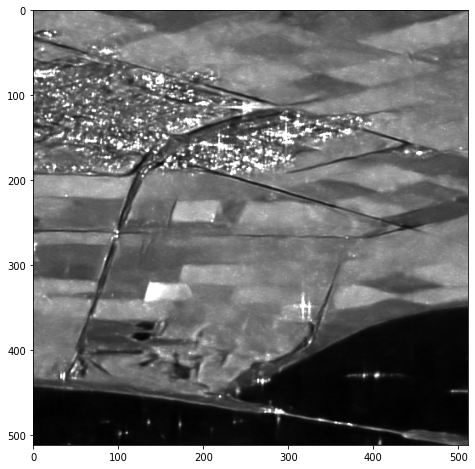

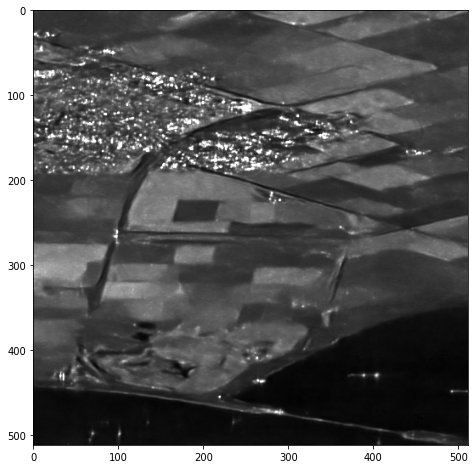

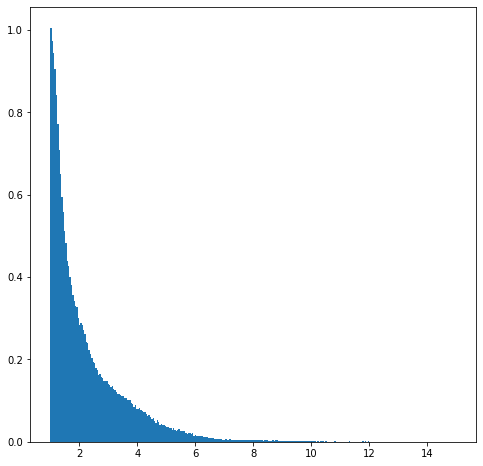

In [ ]:
im1_d = np.abs(im_lely_multitemp_denoised[0][:,:,idx1]) #amplitude
im2_d = np.abs(im_lely_multitemp_denoised[0][:,:,idx2]) #amplitude
ratio_image_denoised = np.square(im1_d/(im2_d+0.001)) 
phi_denoised = np.maximum(ratio_image_denoised, 1/ratio_image_denoised) 

plot_lely(im1_d)
plot_lely(im2_d)
plot_histogram(phi_denoised,low=1.0,high=15.0)

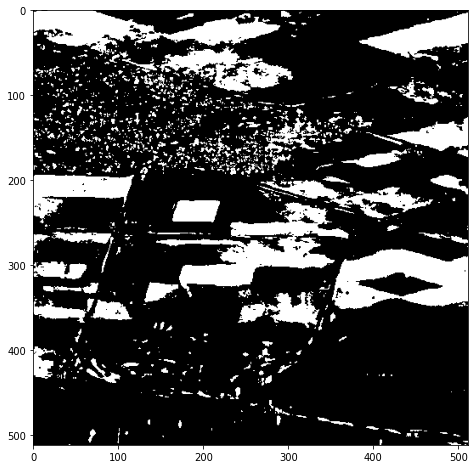

In [ ]:
threshold = 3.0
apply_thesholding(phi_denoised,threshold) 

As images have been denoised, one can also simply compute the absolute difference between the two dates at hand.

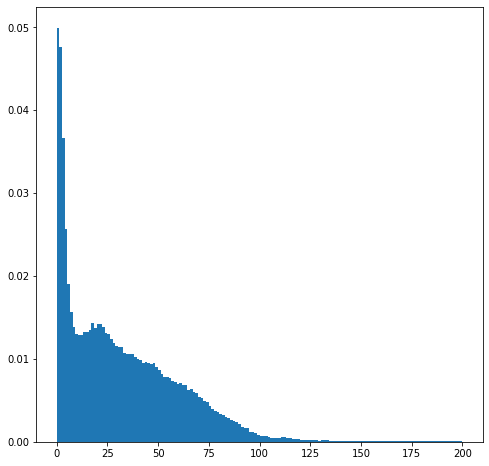

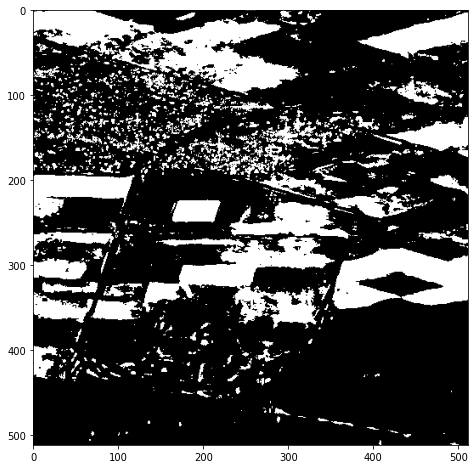

In [ ]:
plot_histogram(np.abs(im1_d-im2_d),low=0.0,high=200.0)
apply_thesholding(np.abs(im1_d-im2_d),50)

### 2.2 Visualize changes between three images
We can display changes between three different acquisitions by plotting them in a false color representation, as if each date corresponds to one of the R, G, B channel of a color image.

You can change the indexed and see what happens if you don't have changes (choose always the same image), or if you only have changes at a given date (which color is assigned to the change.)

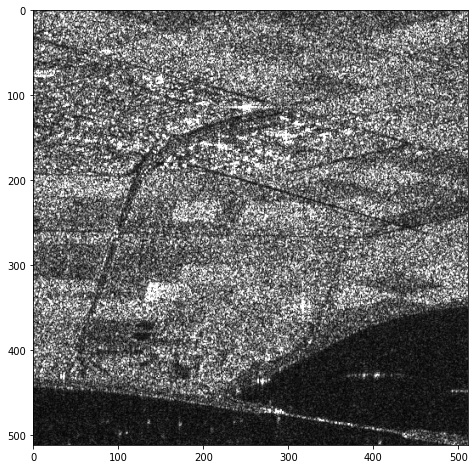

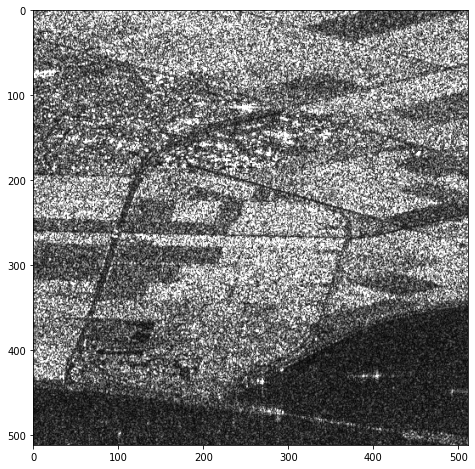

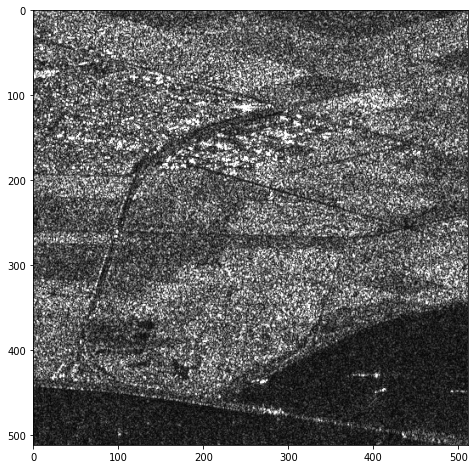

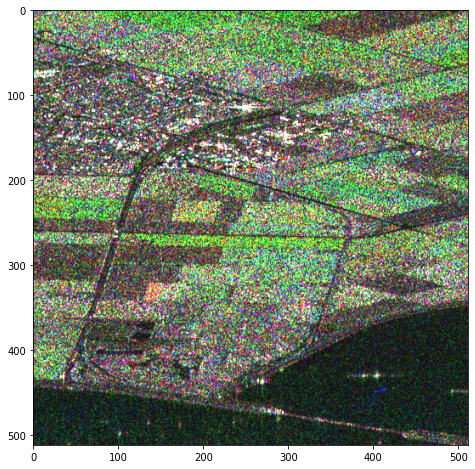

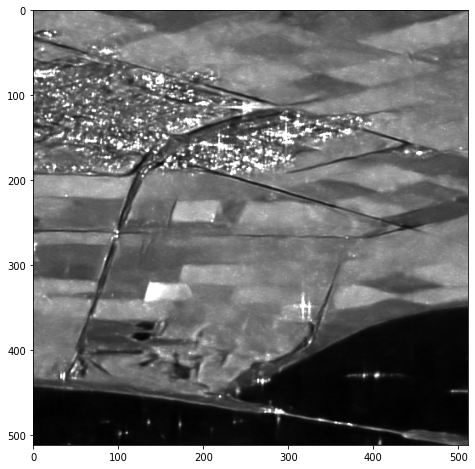

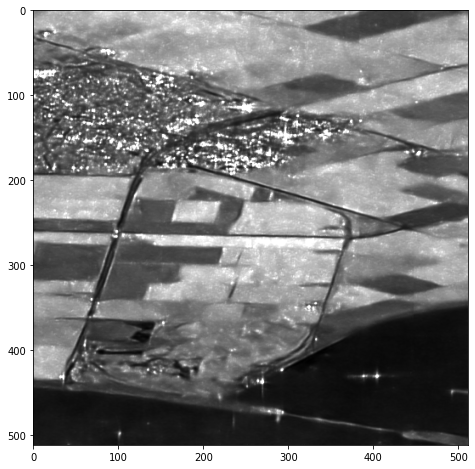

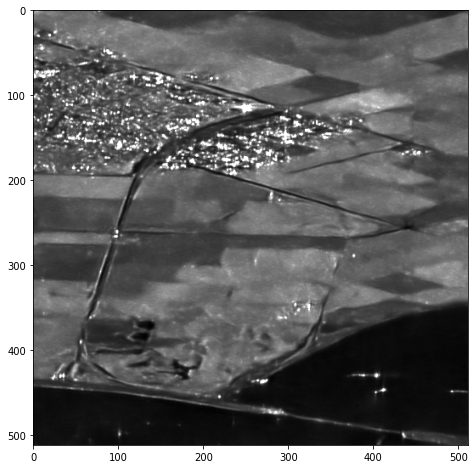

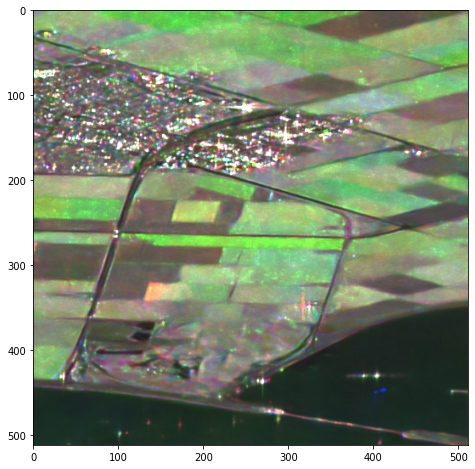

In [ ]:
idx1 = 1 
idx2 = 3 
idx3 = 2
im1 = np.abs(im_lely_multitemp[0][:,:,idx1])
im2 = np.abs(im_lely_multitemp[0][:,:,idx2])
im3 = np.abs(im_lely_multitemp[0][:,:,idx3])

plot_lely(im1)
plot_lely(im2)
plot_lely(im3)
plot_lely_multichannel(im1,im2,im3)

im1_d = np.abs(im_lely_multitemp_denoised[0][:,:,idx1])
im2_d = np.abs(im_lely_multitemp_denoised[0][:,:,idx2])
im3_d = np.abs(im_lely_multitemp_denoised[0][:,:,idx3])
plot_lely(im1_d)
plot_lely(im2_d)
plot_lely(im3_d)
plot_lely_multichannel(im1_d,im2_d,im3_d)

### 2.3. Compute statistics on the entire time series
We have at our disposal a stack of 25 Sentinel-1 images **well registered**. We are going to compute on the stack the aritmentic mean and the geometric mean. This way, we can identify which areas have the most changed and which areas has remained constant over time. 

Indeed, the artimetic mean is equal or greater than the geometrical mean, so the ratio will be equal to one if there hasn't been any change, greater than one otherwise. Thus, one can threshold it to detect changes.

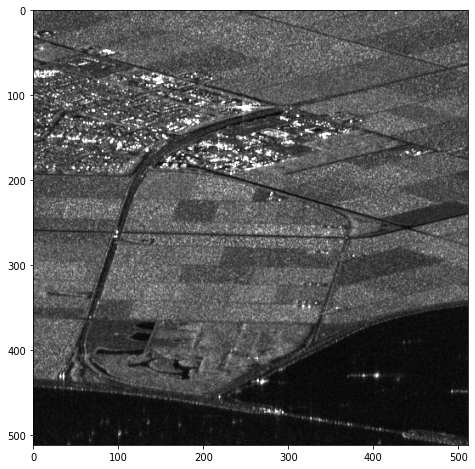

Aritmetic mean on amplitude


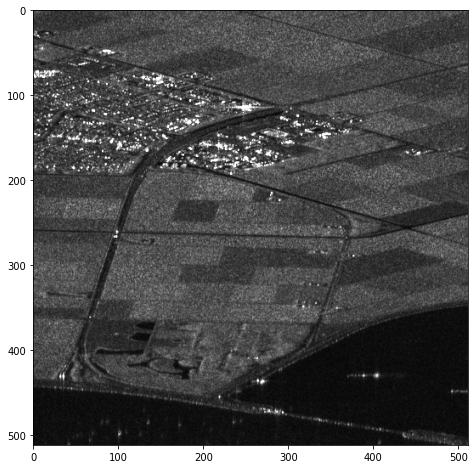

Geometric mean
Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


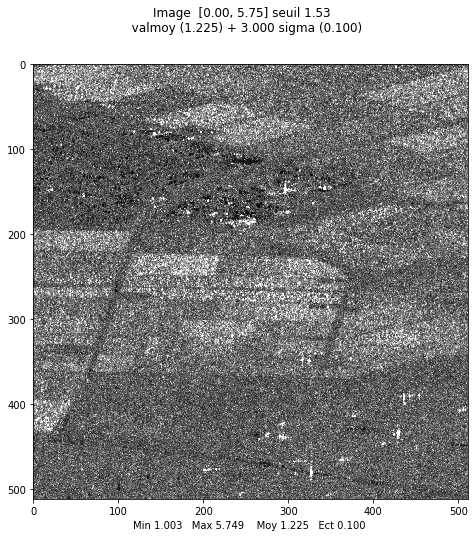

<Figure size 576x576 with 0 Axes>

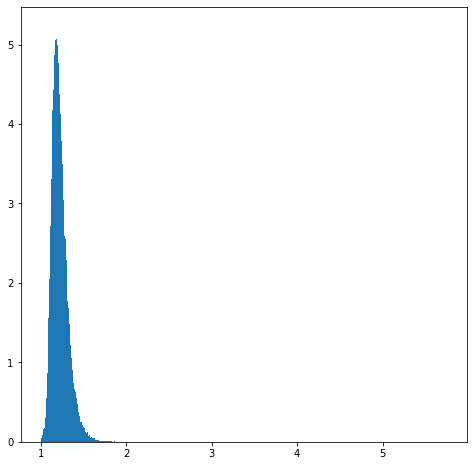

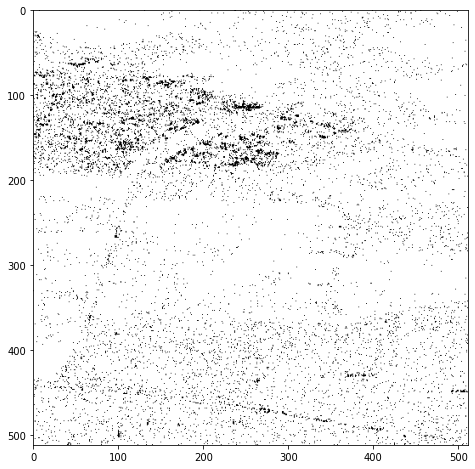

In [ ]:
###########################
#%% Arithmetic mean
pileabs=np.abs(im_lely_multitemp[0])
pileabsMA=np.mean(pileabs,axis=2)
plot_lely(pileabsMA)
print('Aritmetic mean on amplitude')


###########################
#%% Geometric mean
pileabslog=np.log(pileabs+0.01)
pileabslogMG=np.mean(pileabslog,axis=2)
pileabsMG=np.exp(pileabslogMG)
plot_lely(pileabsMG)
print('Geometric mean')

#%%
mvalab.visusar(np.divide(pileabsMA,pileabsMG))
plt.suptitle(u'Aritmetic mean over geometric mean')
plot_histogram(np.divide(pileabsMA,pileabsMG))
apply_thesholding(np.divide(pileabsMA,pileabsMG),1.1)

<Figure size 576x576 with 0 Axes>

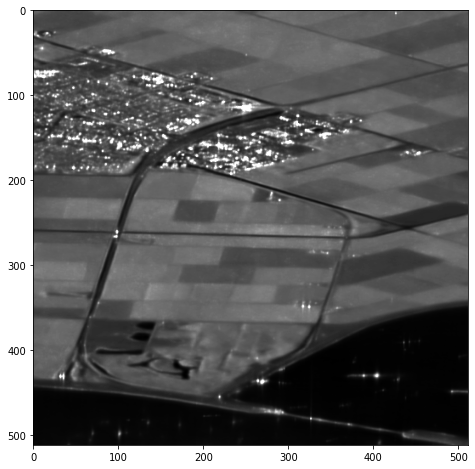

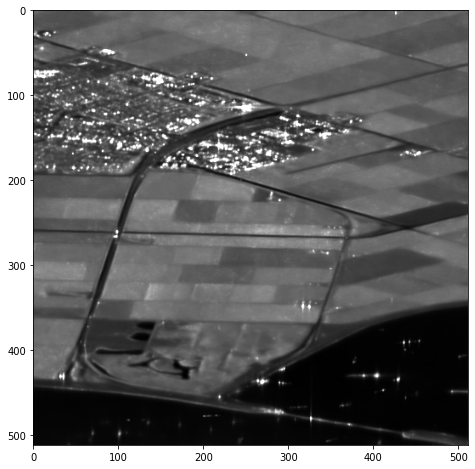

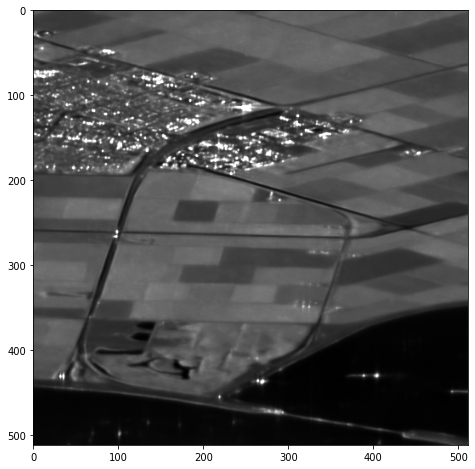

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


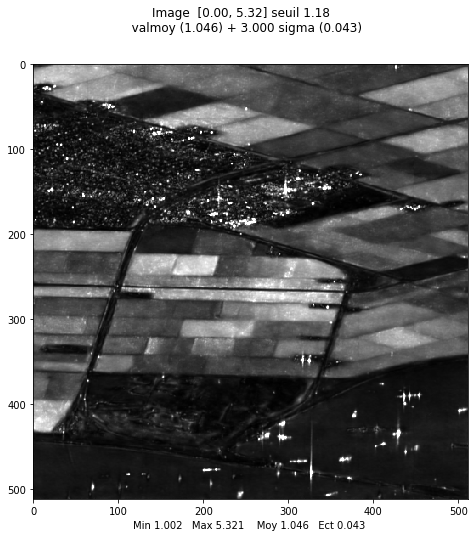

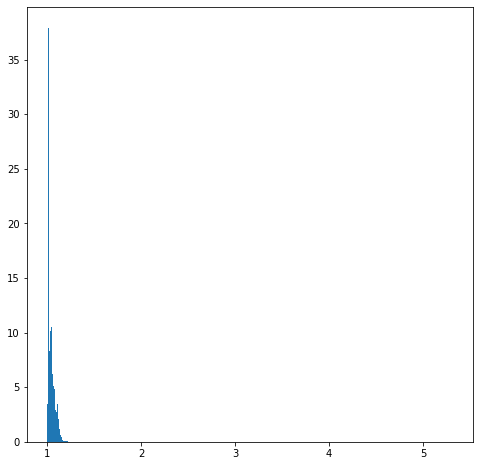

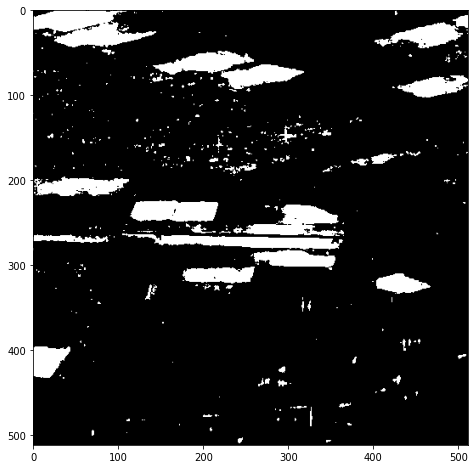

In [ ]:
###########################
#%% Arithmetic mean
pileabs_d=im_lely_multitemp_denoised[0]

pileabsMA_d=np.mean(pileabs_d,axis=2)
plt.set_cmap('gray')
plot_lely(pileabsMA_d)

###########################
#%% Arithmetic mean on intensity
pileabsp2_d=np.square(pileabs_d)

pileabssp2MAI_d=np.mean(pileabsp2_d,axis=2)

pileabsMAI_d=np.sqrt(pileabssp2MAI_d)
plot_lely(pileabsMAI_d)

###########################
#%% Geometric mean
pileabslog_d=np.log(pileabs_d+0.01)
pileabslogMG_d=np.mean(pileabslog_d,axis=2)
pileabsMG_d=np.exp(pileabslogMG_d)
plot_lely(pileabsMG_d)

#%%
mvalab.visusar(np.divide(pileabsMA_d,pileabsMG_d))
plot_histogram(np.divide(pileabsMA_d,pileabsMG_d))
apply_thesholding(np.divide(pileabsMA_d,pileabsMG_d),1.1)

### 2.4 Visualize changes on a time series: REACTIV method (Rapid EAsy Change  in radar TIme series by Variation coefficient)
When long time series are available, one can be interested to having a look at the entire time span between the beginning and the end of the image stack, highlighting changes occurred at a given date.

To do that, we can use the REACTIV visualization tool that is implemented below.

We can go to the color space HSV, where 
- hue in representative of the time, 
- the saturation highlights the color where the change is significant, 
- value is the radar intensity.

We will compute the coefficient of variation on time $\gamma=\frac{\sigma}{\mu}$ and use it to plot the time series in the new color space to highlight changes.

*References*:
```
Colin Koeniguer, Elise, and Jean-Marie Nicolas.
"Change Detection Based on the Coefficient of
Variation in SAR Time-Series of Urban Areas."
Remote Sensing 12.13 (2020): 2089
```
*and* 
```
Di Martino, T., Colin-Koeniguer, E., 
Guinvarc’h, R., & Thirion-Lefevre, L. (2020).
REACTIV Algorithm
```

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


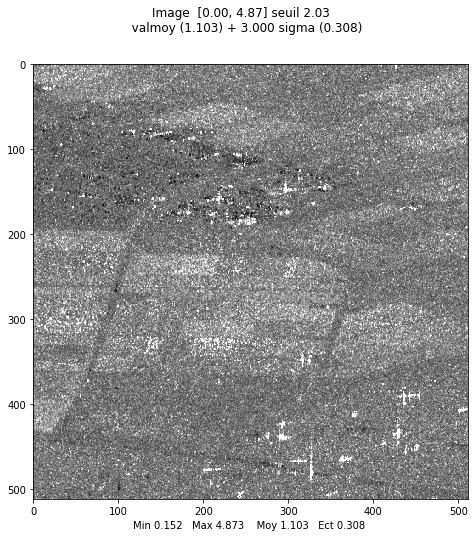

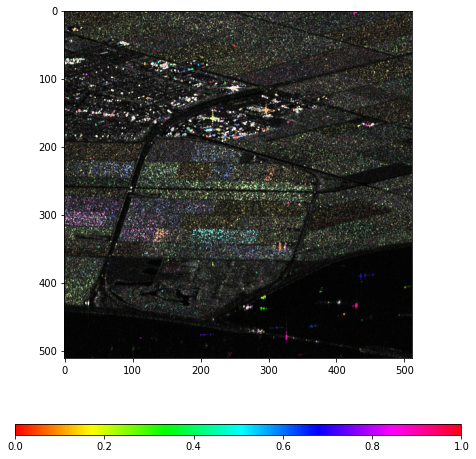

In [ ]:
# compute the coefficient of variation on time

pileabsp2 = np.square(pileabs)
pileabssp2MAI = np.mean(pileabsp2,axis=2)
pileabssp2MSTD = np.std(pileabsp2,axis=2)
coeff_var_time = np.divide(pileabssp2MSTD,pileabssp2MAI)
mvalab.visusar(coeff_var_time)

#For HSV, Hue range is [0,179], Saturation range is [0,255] and Value range is [0,255].
h = (np.argmax(pileabsp2,axis=2)+1)/25 # Hue
s = coeff_var_time; s = s/s.max() # Saturation
v = np.max(pileabsp2,axis=2); v = np.clip(v,0,296769)/296769 # value

import colorsys
        
rgb_color = np.ones((coeff_var_time.shape[0],coeff_var_time.shape[1],3))
for i_row in range(coeff_var_time.shape[0]):
    for i_col in range(coeff_var_time.shape[1]):
        rgb_color[i_row,i_col,:] = colorsys.hsv_to_rgb(h[i_row,i_col], s[i_row,i_col], v[i_row,i_col])
    
plt.figure()
plt.imshow(rgb_color)
plt.set_cmap('hsv')
plt.colorbar(orientation="horizontal", fraction=0.05, aspect=40)
plt.show()

Affichage d'une image reelle
plt.show dans visusar : image 512 x 512


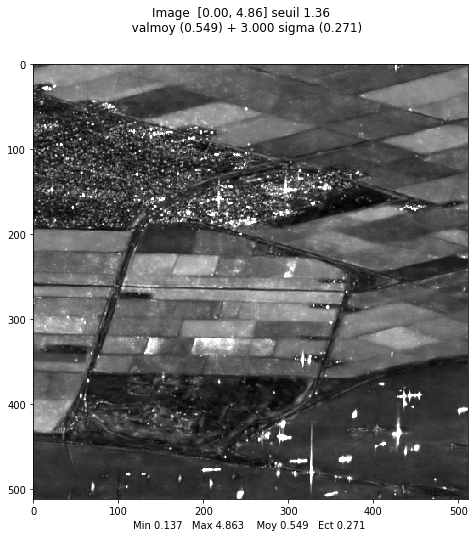

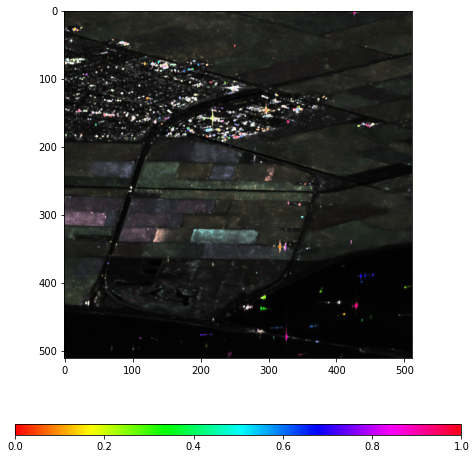

In [ ]:
pileabssp2MSTD_d = np.std(pileabsp2_d,axis=2)
coeff_var_time_d = np.divide(pileabssp2MSTD_d,pileabssp2MAI_d)
mvalab.visusar(coeff_var_time_d)

#For HSV, Hue range is [0,179], Saturation range is [0,255] and Value range is [0,255].
h_d = (np.argmax(pileabsp2_d,axis=2)+1)/25
s_d = coeff_var_time_d; s_d = s_d/s_d.max()
v_d = np.max(pileabsp2_d,axis=2); v_d = np.clip(v_d,0,206769)/206769
        
rgb_color_d = np.ones((coeff_var_time_d.shape[0],coeff_var_time_d.shape[1],3))
for i_row in range(coeff_var_time.shape[0]):
    for i_col in range(coeff_var_time.shape[1]):
        rgb_color_d[i_row,i_col,:] = colorsys.hsv_to_rgb(h_d[i_row,i_col], s_d[i_row,i_col], v_d[i_row,i_col])
    
plt.figure()
plt.imshow(rgb_color_d)
plt.set_cmap('hsv')
plt.colorbar(orientation="horizontal", fraction=0.05, aspect=40)
plt.show()